# Optimisation of Multiple Control Strategies on a Dengue Fever Model.

Sandra Montes (@slmontes), 2025-02-20

## Introduction

This example explores the optimal control on a dengue fever model using multiple combinations of NPIs strategies. The model and strategies tested match those presentented by [Asamoah et al. (2021)](https://www.sciencedirect.com/science/article/pii/S2211379721009487?via%3Dihub). The model takes into account 2 populations: human and female mosquito or vector population. The human population is divided into 5 compartments: susceptible `S_h`, infected (symptomatic) `I_h`, carrier (asymptomatic) `I_hA`, partially immune `P`, and recovered `R_h`. While the mosquito population is formed by 2 compartments: susceptible `S_v` and infected `I_v`. 

The model is described by the following differential equations:

$$
\begin{aligned}
N_h(t) &= S_h(t) + I_h(t) + I_hA(t) + P(t) + R_h(t),\\
N_v(t) &= S_v(t) + I_v(t),\\
\lambda_h(t) &= \frac{(1 - u_1(t)) b \beta_1}{N_h(t)} I_v(t),\\
\lambda_h1(t) &= \frac{(1 - u_1(t)) b \beta_2}{N_h(t)} I_v(t),\\
\lambda_v(t) &= \frac{b \beta_3}{N_h(t)} (I_h(t) + I_hA(t)).
\end{aligned}
$$



$$
\begin{aligned}
\frac{dS_h}{dt} &= \mu_h N_h - \lambda_h S_h - S_h u_2 - \mu_h S_h,\\
\frac{dI_h}{dt} &= \psi \lambda_h S_h + \omega \lambda_h1 P - (\mu_h + u_3 + \gamma_h) I_h,\\
\frac{dI_hA}{dt} &= (1 - \psi) \lambda_h S_h + (1 - \omega) \lambda_h1 P - (\mu_h + \gamma_h) I_hA,\\
\frac{dP}{dt} &= u_2 S_h + \rho u_3 I_h + \phi \gamma_h (I_h + I_hA) - \lambda_h1 P - \mu_h P,\\
\frac{dR_h}{dt} &= (1 - \rho) u_3 I_h + (1 - \phi) \gamma_h (I_h + I_hA) - \mu_h R_h,\\
\frac{dS_v}{dt} &= \mu_v N_v (1 - u_4) - \lambda_v S_v (1 - u_1) - \mu_v S_v - r_0 u_4 S_v,\\
\frac{dI_v}{dt} &= \lambda_v S_v (1 - u_1) - \mu_v I_v - r_0 u_4 I_v.
\end{aligned}
$$


## Libraries

In [1]:
using JuMP
using Ipopt
using OrdinaryDiffEq
using Plots
using Measures
using MAT

## Functions

Model

In [2]:
function dengue_ode!(du,u,p,t)
    (S_h, I_h, I_hA, P, R_h, S_v, I_v) = u
    (β1, β2, β3, ρ, ψ, γ_h, ω, μ_h, μ_v, φ, r_0, u1, u2, u3, u4) = p
    N_h = S_h + I_h + I_hA + P + R_h
    N_v = S_v + I_v
    λ_h = ((1 - u1) * b * β1 / N_h) * I_v
    λ_h1 = ((1 - u1) * b * β2 / N_h) * I_v
    λ_v = (b * β3 / N_h) * (I_h + I_hA)
    @inbounds begin
        du[1] = μ_h * N_h - λ_h * S_h - S_h * u2 - μ_h * S_h                            # dS_h/dt
        du[2] = ψ * λ_h * S_h + ω * λ_h1 * P - (μ_h + u3 + γ_h) * I_h                   # dI_h/dt
        du[3] = (1 - ψ) * λ_h * S_h + (1 - ω) * λ_h1 * P - (μ_h + γ_h) * I_hA           # dI_hA/dt
        du[4] = u2 * S_h + ρ * u3 * I_h + φ * γ_h * (I_h + I_hA) - λ_h1 * P - μ_h * P   # dP/dt
        du[5] = (1 - ρ) * u3 * I_h + (1 - φ) * γ_h * (I_h + I_hA) - μ_h * R_h           # dR_h/dt
        du[6] = μ_v * N_v * (1 - u4) - λ_v * S_v * (1 - u1) - μ_v * S_v - r_0 * u4 * S_v           # dS_v/dt
        du[7] = λ_v * S_v * (1 - u1) - μ_v * I_v - r_0 * u4 * I_v                                  # dI_v/dt
    end
    nothing
end;

To create plots

In [3]:
function create_combined_plot(ts, u_opts, S_h_opts, I_h_opts, I_hA_opts, P_opts, R_h_opts, S_v_opts, I_v_opts, scenario_label; P_axis=3000, P_legend=:topright, save=false)
    color_palette = [:red, :blue, :green, :magenta, :purple, :cyan, :orange, :yellow];
    linestyle_palette = [:solid, :dash, :dot, :dashdot, :dashdotdot, :dash, :dot, :dashdot];

    combined_plot = plot(layout = (3, 2), dpi=300, size=(1200,1500),
                            left_margin=10mm, right_margin=10mm, top_margin=10mm, bottom_margin=10mm)

        # First subplot: 
        for (i, I_h_opt) in enumerate(I_h_opts)
            plot!(combined_plot[1, 1], ts, I_h_opt, 
                label="Scenario $(scenario_label[i])", 
                linewidth=3, color=color_palette[i], thickness_scaling=1,
                xlim=(0, ts[end]),
                ylim=(0, 600),
                xtickfontsize=12, ytickfontsize=12,
                xguidefontsize=14, yguidefontsize=14,
                legendfontsize=12, legend=:topright)
        end
        xlabel!(combined_plot[1, 1], "Time (days)")
        ylabel!(combined_plot[1, 1], "Symptomatic humans, I_h")
        title!(combined_plot[1, 1], "Symptomatic humans, I_h")
        
    
        # Second subplot: 
        for (i, I_hA_opt) in enumerate(I_hA_opts)
            plot!(combined_plot[1, 2], ts, I_hA_opt, 
                label="Scenario $(scenario_label[i])", 
                linewidth=3, color=color_palette[i], thickness_scaling=1,
                xlim=(0, ts[end]+1),
                ylim=(0, 800),
                xtickfontsize=12, ytickfontsize=12,
                xguidefontsize=14, yguidefontsize=14,
                legendfontsize=12, legend=:topright)
        end
        xlabel!(combined_plot[1, 2], "Time (days)")
        ylabel!(combined_plot[1, 2], "Asymptomatic humans, I_hA")
        title!(combined_plot[1, 2], "Asymptomatic humans, I_hA")
    
        # Third subplot: 
        for (i, S_v_opt) in enumerate(S_v_opts)
            plot!(combined_plot[2, 1], ts, S_v_opt, 
                label="Scenario $(scenario_label[i])", 
                linewidth=3, color=color_palette[i], thickness_scaling=1,
                xlim=(0, ts[end]),
                ylim=(0, 6500),
                xtickfontsize=12, ytickfontsize=12,
                xguidefontsize=14, yguidefontsize=14,
                legendfontsize=12,
                legend=:right)
        end
        xlabel!(combined_plot[2, 1], "Time (days)")
        ylabel!(combined_plot[2, 1], "Susceptible mosquitoes, S_v")
        title!(combined_plot[2, 1], "Susceptible mosquitoes, S_v")

        # Fourth subplot: 
        for (i, I_v_opt) in enumerate(I_v_opts)
            plot!(combined_plot[2, 2], ts, I_v_opt, 
                label="Scenario $(scenario_label[i])", 
                linewidth=3, color=color_palette[i], thickness_scaling=1,
                xlim=(0, ts[end]),
                ylim=(0, 3500),
                xtickfontsize=12, ytickfontsize=12,
                xguidefontsize=14, yguidefontsize=14,
                legendfontsize=12, legend=:topright)
        end
        xlabel!(combined_plot[2, 2], "Time (days)")
        ylabel!(combined_plot[2, 2], "Infected mosquitoes, I_v")
        title!(combined_plot[2, 2], "Infected mosquitoes, I_v")

        # Fifth subplot: 
        for (i, P_opt) in enumerate(P_opts)
            plot!(combined_plot[3, 1], ts, P_opt, 
                label="Scenario $(scenario_label[i])", 
                linewidth=3, color=color_palette[i], thickness_scaling=1,
                xlim=(0, ts[end]),
                ylim=(0, P_axis),
                xtickfontsize=12, ytickfontsize=12,
                xguidefontsize=14, yguidefontsize=14,
                legendfontsize=12, legend=(P_legend))
        end
        xlabel!(combined_plot[3, 1], "Time (days)")
        ylabel!(combined_plot[3, 1], "Partially immune, P")
        title!(combined_plot[3, 1], "Partially immune, P")

        if !isempty(u_opts)
            # u_opts = [u1_opt_1, u2_opt_1, u3_opt_1, u4_opt_1]
            for (i, u_opt) in enumerate(u_opts)
                plot!(combined_plot[3, 2], ts, u_opt, label="u$i", linewidth=3, color=color_palette[i], linestyle=linestyle_palette[i], thickness_scaling=1,
                    xlim=(0, ts[end]+1),
                    ylim=(0, 1.1),
                    xtickfontsize=12, ytickfontsize=12,
                    xguidefontsize=14, yguidefontsize=14,
                    legendfontsize=12, legend_columns=4,
                    legend=:topright)
            end
            xlabel!(combined_plot[3, 2], "Time (days)")
            title!(combined_plot[3, 2], "Control Profiles Scenario $(scenario_label[2])")
        end
    
    display(combined_plot)

        # Save the plot if `save=true`
    if save
        filename = "OptControl_Dengue_$((scenario_label[2])).png"
        savefig(combined_plot, filename)
        println("Plot saved as $filename")
    end
end;


To easily run the optimisation of different strategies 

In [4]:
function run_optimization(u1_max, u2_max, u3_max, u4_max)

    # Model definition with Ipopt optimizer
    model = Model(Ipopt.Optimizer)
    set_optimizer_attribute(model, "max_iter", 10000)
    set_optimizer_attribute(model, "print_level", 5)  
    set_optimizer_attribute(model, "tol", 1e-6)

    u1_init = 0
    u2_init = 0
    u3_init = 0
    u4_init = 0

    T = Int(tf/dt)

    @variable(model, S_h[1:(T+1)] >= 0)     # Susceptible humans
    @variable(model, I_h[1:(T+1)] >= 0)     # Infected symptomatic
    @variable(model, I_hA[1:(T+1)] >= 0)    # Carriers asymptomatic
    @variable(model, P[1:(T+1)] >= 0)       # Partially immune
    @variable(model, R_h[1:(T+1)] >= 0)     # Recovered humans
    @variable(model, S_v[1:(T+1)] >= 0)     # Susceptible mosquitoes
    @variable(model, I_v[1:(T+1)] >= 0)     # Infected mosquitoes 
    
    @variable(model, 0 <= u1[1:(T+1)] <= u1_max)   # Treated bednet  
    @variable(model, 0 <= u2[1:(T+1)] <= u2_max)        # Vaccination
    @variable(model, 0 <= u3[1:(T+1)] <= u3_max)        # Treatment (prophylactics)
    @variable(model, 0 <= u4[1:(T+1)] <= u4_max)        # Insecticides
    
    # Initial conditions
    @constraints(model, begin
        S_h[1] == S_h0
        I_h[1] == I_h0
        I_hA[1] == I_hA0
        P[1] == P0
        R_h[1] == R_h0
        S_v[1] == S_v0
        I_v[1] == I_v0
        u1[1] == u1_init
        u2[1] == u2_init
        u3[1] == u3_init
        u4[1] == u4_init
        u1[T+1] == u1[T]
        u2[T+1] == u2[T]
        u3[T+1] == u3[T]
        u4[T+1] == u4[T]
    end);

    # Population sizes and infection rates
    @expressions(model, begin
        N_h[t=1:T], (S_h[t] + I_h[t] + I_hA[t] + P[t] + R_h[t])
        N_v[t=1:T], (S_v[t] + I_v[t])
        lambda_h[t=1:T], ((1 - u1[t]) * b * beta_1 / N_h[t]) * I_v[t]
        lambda_h1[t=1:T], ((1 - u1[t]) * b * beta_2 / N_h[t]) * I_v[t]
        lambda_v[t=1:T], (b * beta_3 / N_h[t]) * (I_h[t] + I_hA[t])
    end)

    # ODEs
    @constraints(model, begin
    [t=1:T], S_h[t+1] == S_h[t] + (mu_h * N_h[t] - lambda_h[t] * S_h[t] - S_h[t] * u2[t] - mu_h * S_h[t]) * dt
    [t=1:T], I_h[t+1] == I_h[t] + (psi * lambda_h[t] * S_h[t] + omega * lambda_h1[t] * P[t] - (mu_h + u3[t] + gamma_h) * I_h[t]) * dt
    [t=1:T], I_hA[t+1] == I_hA[t] + ((1 - psi) * lambda_h[t] * S_h[t] + (1 - omega) * lambda_h1[t] * P[t] - (mu_h + gamma_h) * I_hA[t]) * dt
    [t=1:T], P[t+1] == P[t] + (u2[t] * S_h[t] + rho * u3[t] * I_h[t] + phi * gamma_h * (I_h[t] + I_hA[t]) - lambda_h1[t] * P[t] - mu_h * P[t]) * dt
    [t=1:T], R_h[t+1] == R_h[t] + ((1 - rho) * u3[t] * I_h[t] + (1 - phi) * gamma_h * (I_h[t] + I_hA[t]) - mu_h * R_h[t]) * dt
    [t=1:T], S_v[t+1] == S_v[t] + (mu_v * N_v[t] * (1 - u4[t]) - lambda_v[t] * S_v[t] * (1 - u1[t]) - mu_v * S_v[t] - r_0 * u4[t] * S_v[t]) * dt
    [t=1:T], I_v[t+1] == I_v[t] + (lambda_v[t] * S_v[t] * (1 - u1[t]) - mu_v * I_v[t] - r_0 * u4[t] * I_v[t]) * dt
    end);


    # Objective function
    @objective(model, Min, sum(
        C_1 * I_h[t] + C_2 * I_hA[t] + C_3 * (S_v[t] + I_v[t]) + (D_1 * u1[t]^2)/2 + (D_2 * u2[t]^2)/2 + (D_3 * u3[t]^2)/2 + (D_4 * u4[t]^2)/2
        for t in 1:T
    ));

    if silent
        set_silent(model)
    end

    # Run optimization
    optimize!(model)
    println("Termination status: $(termination_status(model))")

    return value.(u1), value.(u2), value.(u3), value.(u4), value.(S_h), value.(I_h), value.(I_hA), value.(P), value.(R_h), value.(S_v), value.(I_v)
end;

## Running the model without interventions

Parameters

In [5]:
beta_1 = 0.75;  #Transmission prob from I_v to S_h
beta_2 = 0.375; #Transmission prob from I_h to S_v
beta_3 = 0.75;  #Transmission prb from I_v to P
b =  0.5;       #Avg bitting rate per mosquito per person
rho = 0.01;     #Proportion of treated individuals with partial immunity
psi = 0.4;      #Proportion of incidence rate from S_h to I_h
gamma_h = 0.3288330; #Disease related death rate of humans
omega = 0.54;   #Proportion of incidence rate from P to I_h
mu_h = 0.0045;  #Natural mortality rate and recruitment rate of humans
mu_v = 0.0323;  #Natural mortality rate and recruitment rate of vector
phi = 0.48;     #Proportion of natural Recovery
r_0 = 0.005;    #Enhance death rate

u_1 = 0.0;      #Treated bednet
u_2 = 0.0;      #Vaccination
u_3 = 0.0;      #Treatment (prophylactics)
u_4 = 0.0;      #Insecticides

Time and initial conditions

In [6]:
t0 = 0.0;
tf = 300.0;
dt = 0.5;
ts = collect(0:dt:tf);

S_h0 = 10000;
I_h0 = 100;
I_hA0 = 500;
P0 = 100;
R_h0 = 1000;
S_v0 = 6000;
I_v0 = 600;

δ = 0.001;

alg = Tsit5();

u0 = [S_h0, I_h0, I_hA0, P0, R_h0, S_v0, I_v0];
params = [beta_1, beta_2, beta_3, rho, psi, gamma_h, omega, mu_h, mu_v, phi, r_0, u_1, u_2, u_3, u_4];


In [7]:
prob_base = ODEProblem(dengue_ode!, u0, (t0, tf), params)
sol_base = solve(prob_base, alg, saveat=ts);

Extract data:

In [8]:
t_base = sol_base.t;
S_h_baseline = sol_base[1, :];
I_h_baseline = sol_base[2, :];
I_hA_baseline = sol_base[3, :];
P_baseline = sol_base[4, :];
R_h_baseline = sol_base[5, :];
S_v_baseline = sol_base[6, :];
I_v_baseline = sol_base[7, :];

Plot baseline

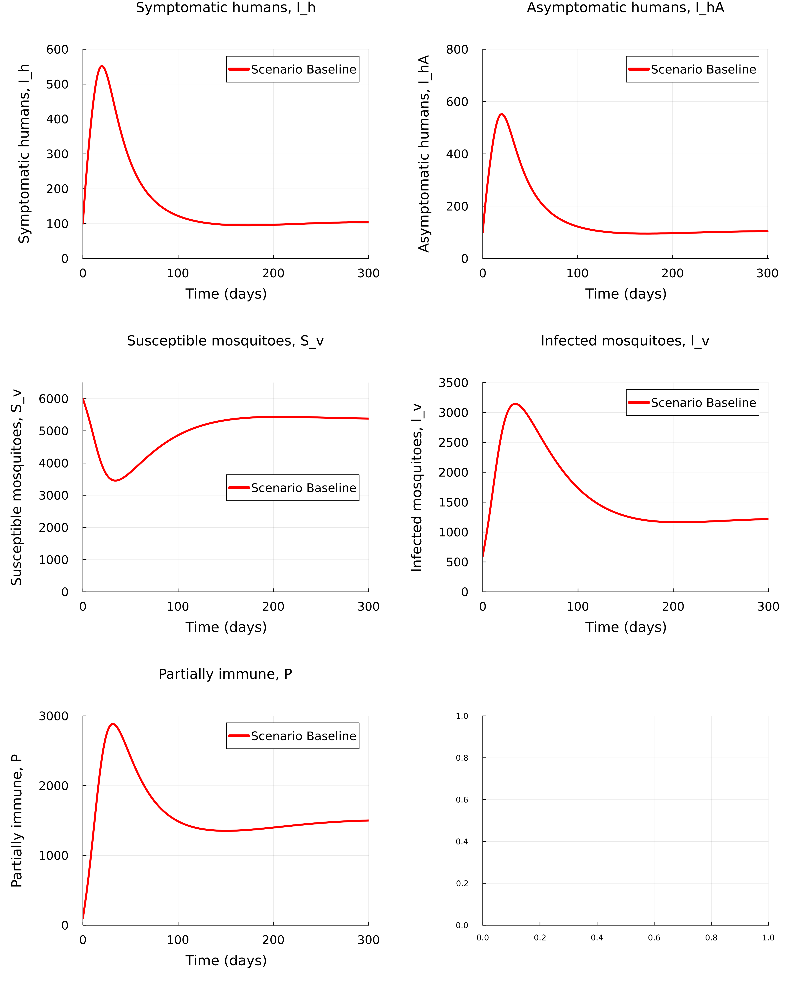

In [9]:
Scenario_test = create_combined_plot(t_base, 
[], 
[S_h_baseline], 
[I_h_baseline],
[I_h_baseline], 
[P_baseline], 
[R_h_baseline], 
[S_v_baseline], 
[I_v_baseline],
["Baseline"], save=false)

# Strategies

In [10]:
# Weights for the objective function
C_1 = 5;  
C_2 = 5;  
C_3 = 5; 
D_1= 16.62; 
D_2 = 2.5; 
D_3 = 5; 
D_4 = 16.62;

silent = true;

### Strategy A

This strategy combines the use of treated bednets and insectisides

In [11]:
outputA_values = open("OptDengue_StratA_log.txt", "w") do file
    redirect_stdout(file) do
        return run_optimization(0.75, 0, 0, 0.75)
    end
end

# Now extract values from output_values
u1_opt_A, u2_opt_A, u3_opt_A, u4_opt_A, S_h_opt_A, I_h_opt_A, I_hA_opt_A, P_opt_A, R_h_opt_A, S_v_opt_A, I_v_opt_A = outputA_values;

Plot optimal results obtained from Strategy A vs Baseline

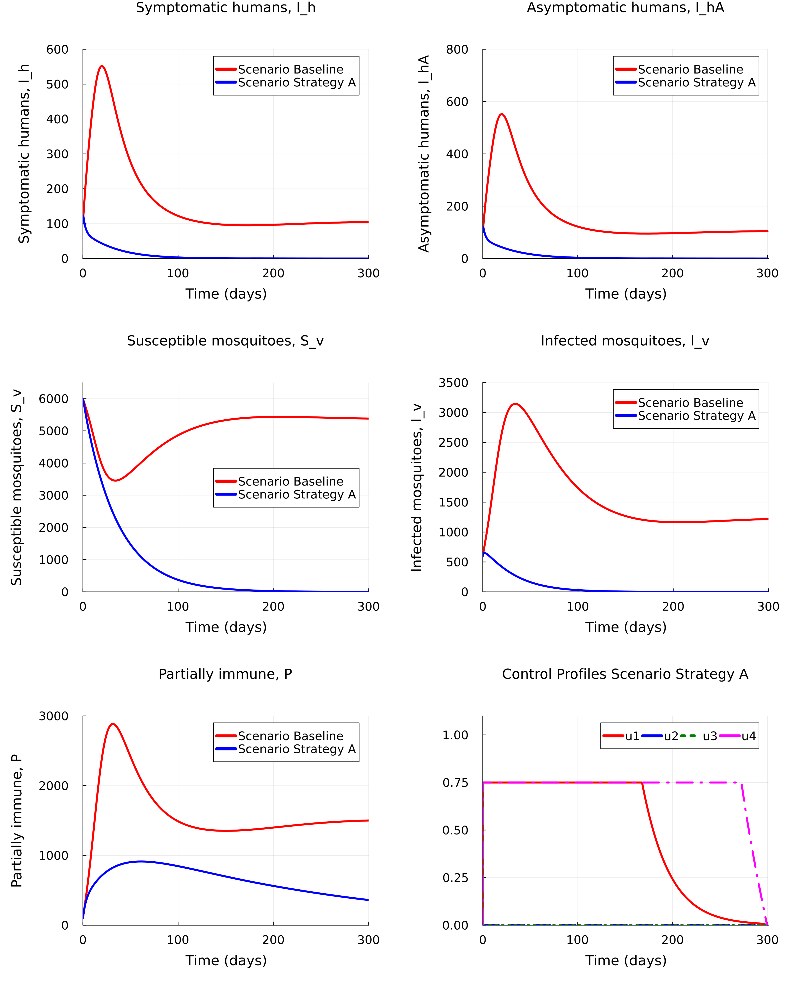

In [12]:
Scenario_A = create_combined_plot(t_base, 
                    [u1_opt_A, u2_opt_A, u3_opt_A, u4_opt_A], 
                    [S_h_baseline, S_h_opt_A], 
                    [I_h_baseline, I_h_opt_A],
                    [I_h_baseline, I_h_opt_A], 
                    [P_baseline, P_opt_A], 
                    [R_h_baseline, R_h_opt_A], 
                    [S_v_baseline, S_v_opt_A], 
                    [I_v_baseline, I_v_opt_A],
                    ["Baseline", "Strategy A"], save=false)

### Strategy B

This strategy combines the use of treatment (prophylactics) and vaccination

In [13]:
outputB_values = open("OptDengue_StratB_log.txt", "w") do file
    redirect_stdout(file) do
        return run_optimization(0, 0.75, 0.75, 0)
    end
end

# Now extract values from output_values
u1_opt_B, u2_opt_B, u3_opt_B, u4_opt_B, S_h_opt_B, I_h_opt_B, I_hA_opt_B, P_opt_B, R_h_opt_B, S_v_opt_B, I_v_opt_B = outputB_values;

Plot optimal results obtained from Strategy B vs Baseline

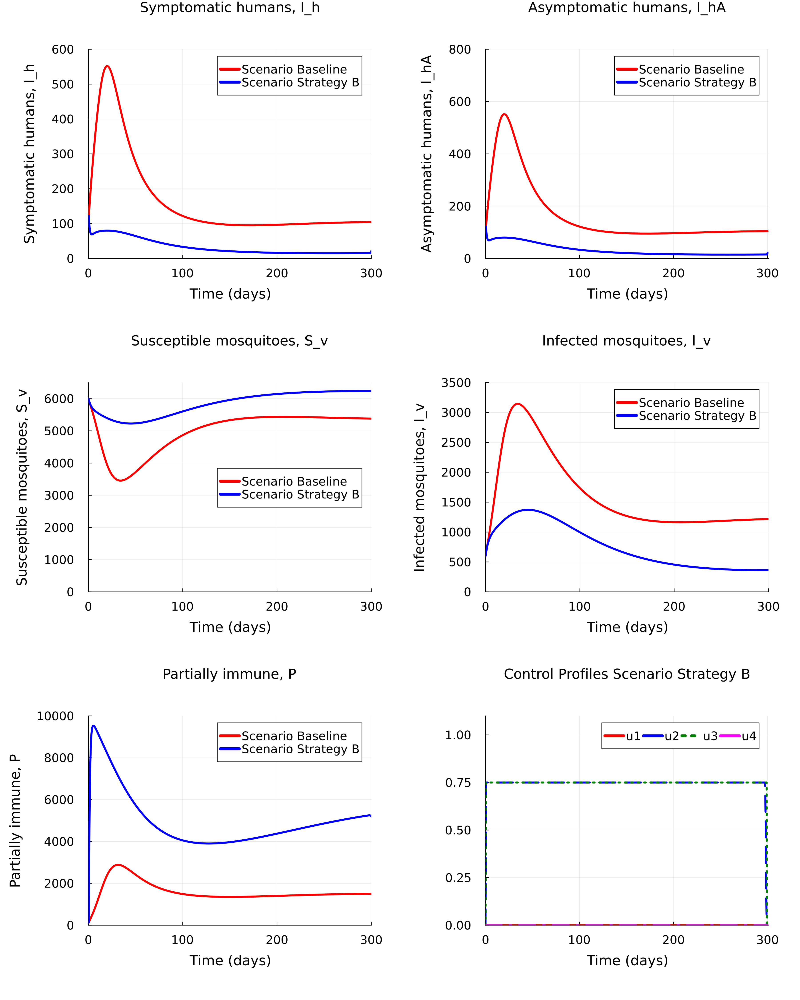

In [14]:
Scenario_B = create_combined_plot(t_base, 
                    [u1_opt_B, u2_opt_B, u3_opt_B, u4_opt_B], 
                    [S_h_baseline, S_h_opt_B], 
                    [I_h_baseline, I_h_opt_B],
                    [I_h_baseline, I_h_opt_B], 
                    [P_baseline, P_opt_B], 
                    [R_h_baseline, R_h_opt_B], 
                    [S_v_baseline, S_v_opt_B], 
                    [I_v_baseline, I_v_opt_B],
                    ["Baseline", "Strategy B"], P_axis=10000, save=false)

### Strategy C

This strategy combines the use of treated bednets, treatment (prophylactics) and insectisides

In [15]:
outputC_values = open("OptDengue_StratC_log.txt", "w") do file
    redirect_stdout(file) do
        return run_optimization(0.75, 0, 0.75, 0.75)
    end
end

# Now extract values from output_values
u1_opt_C, u2_opt_C, u3_opt_C, u4_opt_C, S_h_opt_C, I_h_opt_C, I_hA_opt_C, P_opt_C, R_h_opt_C, S_v_opt_C, I_v_opt_C = outputC_values;

Plot optimal results obtained from Strategy C vs Baseline

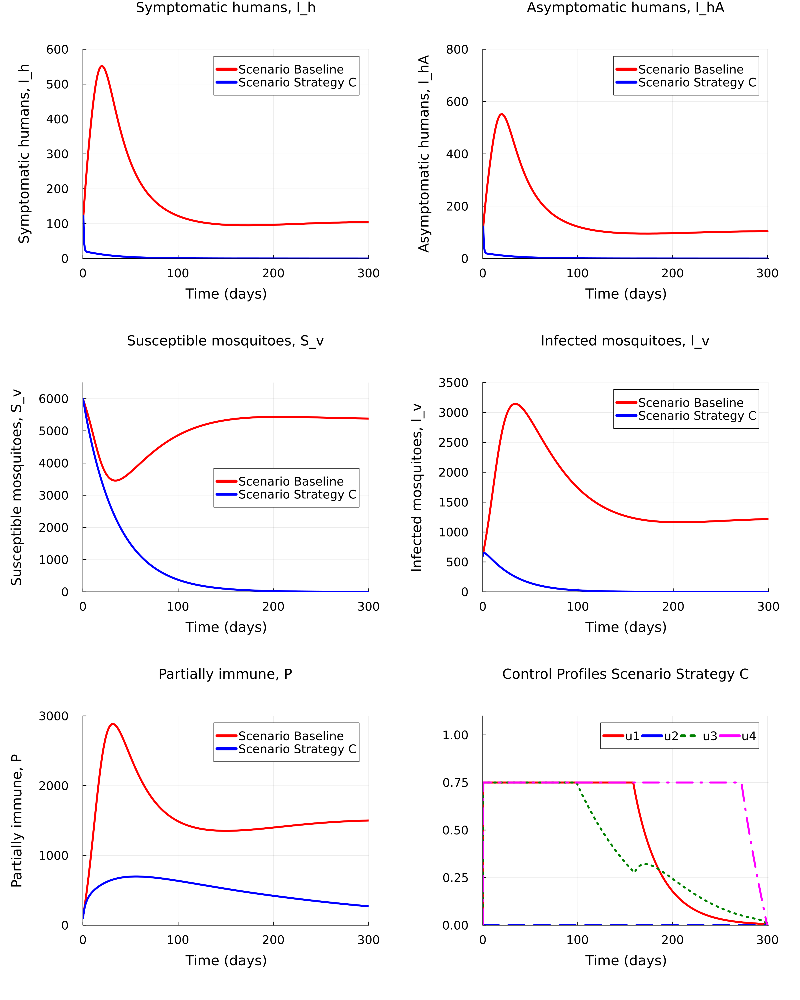

In [16]:
Scenario_C = create_combined_plot(t_base, 
                    [u1_opt_C, u2_opt_C, u3_opt_C, u4_opt_C], 
                    [S_h_baseline, S_h_opt_C], 
                    [I_h_baseline, I_h_opt_C],
                    [I_h_baseline, I_h_opt_C], 
                    [P_baseline, P_opt_C], 
                    [R_h_baseline, R_h_opt_C], 
                    [S_v_baseline, S_v_opt_C], 
                    [I_v_baseline, I_v_opt_C],
                    ["Baseline", "Strategy C"], save=false)

### Strategy D

This strategy combines the use of treated bednets, insectisides and vaccination

In [17]:
outputD_values = open("OptDengue_StratD_log.txt", "w") do file
    redirect_stdout(file) do
        return run_optimization(0.75, 0.75, 0, 0.75)
    end
end

# Now extract values from output_values
u1_opt_D, u2_opt_D, u3_opt_D, u4_opt_D, S_h_opt_D, I_h_opt_D, I_hA_opt_D, P_opt_D, R_h_opt_D, S_v_opt_D, I_v_opt_D = outputD_values;

Plot optimal results obtained from Strategy D vs Baseline

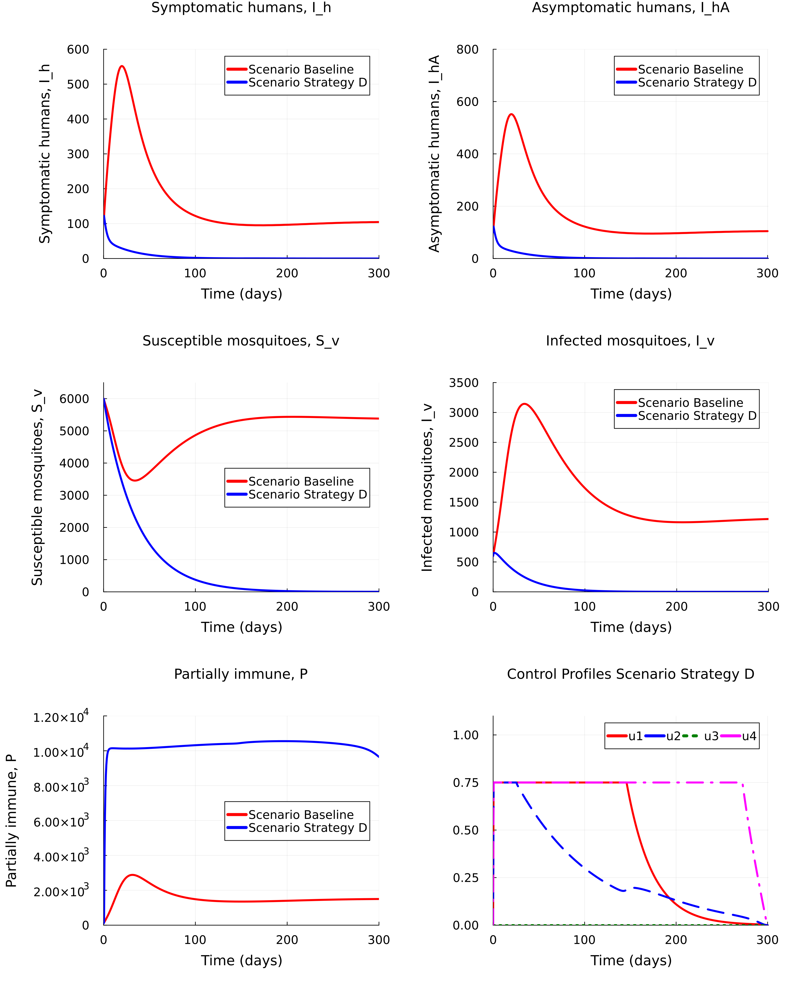

In [18]:
Scenario_D = create_combined_plot(t_base, 
                    [u1_opt_D, u2_opt_D, u3_opt_D, u4_opt_D], 
                    [S_h_baseline, S_h_opt_D], 
                    [I_h_baseline, I_h_opt_D],
                    [I_h_baseline, I_h_opt_D], 
                    [P_baseline, P_opt_D], 
                    [R_h_baseline, R_h_opt_D], 
                    [S_v_baseline, S_v_opt_D], 
                    [I_v_baseline, I_v_opt_D],
                    ["Baseline", "Strategy D"], P_axis=12000, P_legend=:right, save=false)

### Strategy E

This strategy combines the use of the four control interventions treated bednets, insectisides, treatment and vaccination

In [19]:
outputE_values = open("OptDengue_StratE_log.txt", "w") do file
    redirect_stdout(file) do
        return run_optimization(0.75, 0.75, 0.75, 0.75)
    end
end

# Now extract values from output_values
u1_opt_E, u2_opt_E, u3_opt_E, u4_opt_E, S_h_opt_E, I_h_opt_E, I_hA_opt_E, P_opt_E, R_h_opt_E, S_v_opt_E, I_v_opt_E = outputE_values;

Plot optimal results obtained from Strategy E vs Baseline

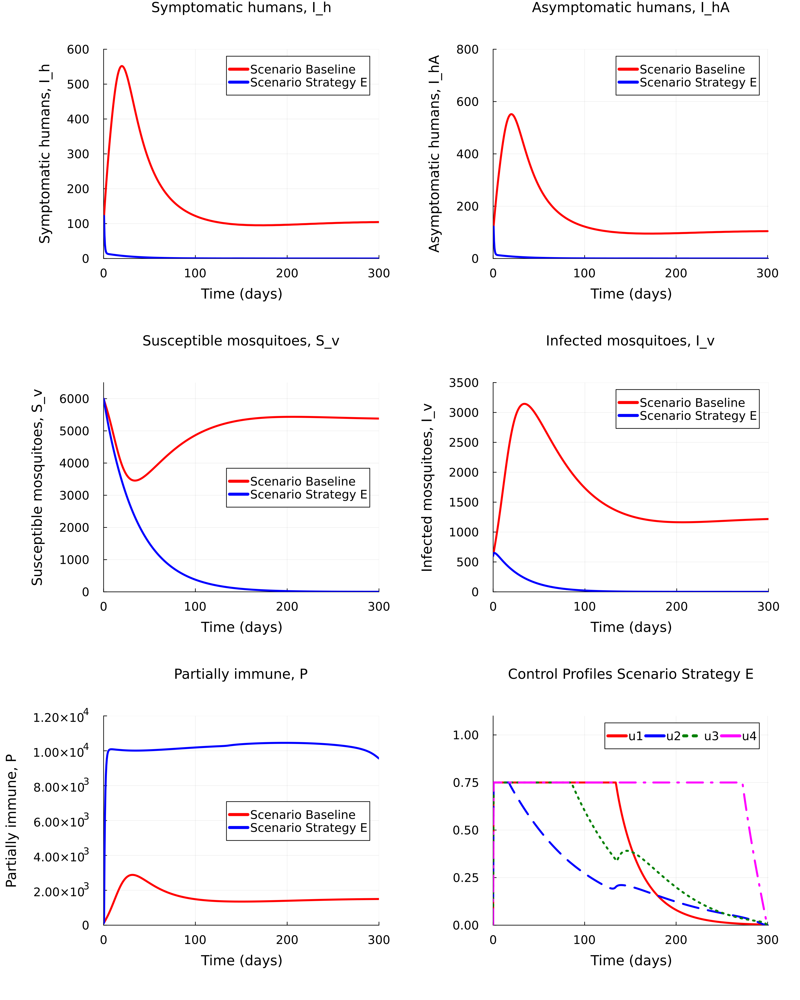

In [20]:
Scenario_E = create_combined_plot(t_base, 
                    [u1_opt_E, u2_opt_E, u3_opt_E, u4_opt_E], 
                    [S_h_baseline, S_h_opt_E], 
                    [I_h_baseline, I_h_opt_E],
                    [I_h_baseline, I_h_opt_E], 
                    [P_baseline, P_opt_E], 
                    [R_h_baseline, R_h_opt_E], 
                    [S_v_baseline, S_v_opt_E], 
                    [I_v_baseline, I_v_opt_E],
                    ["Baseline", "Strategy E"], P_axis=12000, P_legend=:right, save=false)

----------------------------------------------------------------------------------------------------------------------------------------------------------------------------